In [20]:
import os
import re
import random
import warnings
from pathlib import Path

import numpy as np
import pandas as pd
import tifffile
import matplotlib.pyplot as plt

import sys
sys.path.insert(0, '/Users/elysiaye/alignment')

from alignment import caiman_memmap_reader, minmax_scaler
from registration import sitkalignment

### Set up folder and select fish to align

In [21]:
# Optional quick setup (main config is in the dedicated config cell below)
data_folder = Path('/Volumes/Kobi/DOI_animals_good')
fish_name = 'elavl3H2BGCaMP6s_9dpf_DOI_50ugml_15_20250925'
plane = 0
selected_plane = 0

exp_folder = data_folder / fish_name
_mcorr_dir = exp_folder / 'mcorr_tiff_outputs'
if not _mcorr_dir.is_dir():
    raise FileNotFoundError(f"Missing mcorr output folder: {_mcorr_dir}")
_std_plane_re = re.compile(r'plane(\d+)', re.IGNORECASE)
_matches = [
    p
    for p in _mcorr_dir.glob('STD*')
    if p.is_file() and (m := _std_plane_re.search(p.name)) and int(m.group(1)) == selected_plane
]
if not _matches:
    _std_names = sorted(p.name for p in _mcorr_dir.glob('STD*') if p.is_file())
    raise FileNotFoundError(
        f"No STD* file in {_mcorr_dir} with plane index {selected_plane}. Found STD files: {_std_names}"
    )
if len(_matches) > 1:
    raise ValueError(f"Multiple STD* files match plane{selected_plane}: {_matches}")
external_std_tiff = _matches[0]

### Load in mapZebrain chosen plane

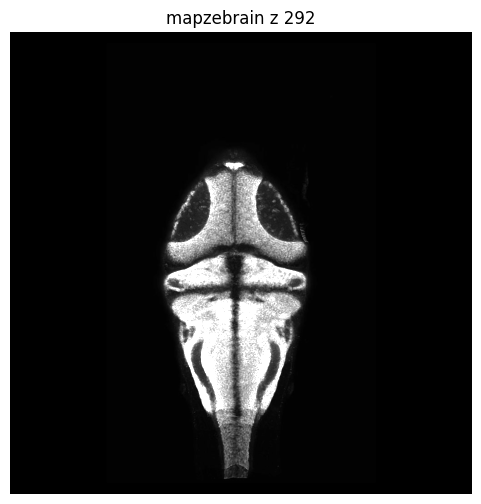

In [3]:
# mapzebrain plane preview (self-contained)
# Tuning: if global alignment is "almost" but A/P or midline is off, try adjacent slices (±1–2).
selected_mapzebrain_z = 292
mapzebrain_img_path = Path(r'./reference_images/hindbrain/mapzebrain/T_AVG_HuCD.tif')

# Load stack here so this cell can run independently.
_source_stack = tifffile.imread(str(mapzebrain_img_path))
if not (0 <= selected_mapzebrain_z < _source_stack.shape[0]):
    raise ValueError(
        f'selected_mapzebrain_z={selected_mapzebrain_z} out of range for stack with '
        f'{_source_stack.shape[0]} slices'
    )

mapzebrain_native = _source_stack[selected_mapzebrain_z, :, :]
mapzebrain_native_shape = mapzebrain_native.shape
source_img = mapzebrain_native
source_img = sitkalignment.embed_image(source_img, 1024)  # matching image sizes to 1024x1024

max_val = float(source_img.max())
if max_val > 0:
    source_img = source_img / max_val  # rescaling pixel brightness --> this is normalizing the image so the new maximum is 1 and everything else is scaled down proportionally
source_img *= 2**10 # mutipling by 2^10 aka 1024

plt.figure(figsize=(6, 6))
# Tuning: display only; does not affect registration. Change vmax to see dim structure.
plt.imshow(source_img, cmap='gray', vmax=700)
plt.title(f'mapzebrain z {selected_mapzebrain_z}')
plt.axis('off')
plt.show()

### Visualize experiment and atlas planes side by side + merged

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


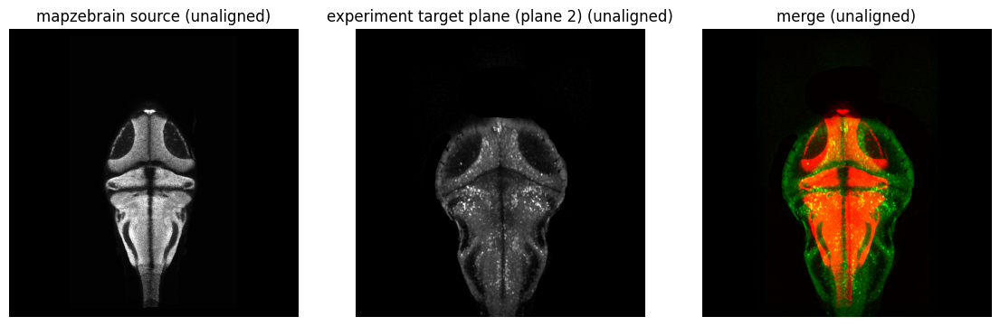

In [4]:
# Unaligned visualization: mapzebrain source, experiment target, RGB merge.
# (Left = `source_img`, center = `plot_img` — do not alias.)
#
# Requires: `source_img`, `plot_img`, `plane`.

# Intensity windows — same pattern as `3_brain_alignment_elysia.ipynb` (tune for display and for registration).
target_vmin = 10
target_vmax = 600
source_vmax = 1024

# Registration masks: exclude top bands from the metric only (full mapzebrain still warps).
EXCLUDE_TOP_ROWS_FIXED = 0  # experiment / plot_img (embedded 1024² rows; row 0 = top)

# Precomputed STD / projection TIFF: apply the same steps as `_std_plane_image` so shapes match `source_img` (1024² embedded).
_raw = np.asarray(tifffile.imread(external_std_tiff), dtype=np.float64)
if _raw.ndim == 3:
    _raw = _raw[0]  # e.g. plane0 in filename; change index if you align another z-slice
elif _raw.ndim != 2:
    raise ValueError(f"Expected 2D or 3D array from STD tiff, got shape {_raw.shape}")
_m = float(np.nanmax(_raw))
plot_img = _raw
if _m > 0:
    plot_img = plot_img / _m
plot_img *= 2**10
plot_img = np.rot90(plot_img, k=1)
plot_img = sitkalignment.embed_image(plot_img, 1024)

if EXCLUDE_TOP_ROWS_FIXED:
    plot_img[:EXCLUDE_TOP_ROWS_FIXED, :] = 0

registration_fixed_mask = sitkalignment.registration_mask_from_exclusions(
    plot_img.shape, exclude_top=EXCLUDE_TOP_ROWS_FIXED
)
registration_moving_mask = np.ones(source_img.shape, dtype=np.uint8)

fig, ax = plt.subplots(1, 3, figsize=(14, 6))
ax[0].imshow(source_img, cmap="gray", vmin=0, vmax=source_vmax)
ax[1].imshow(plot_img, cmap="gray", vmin=target_vmin, vmax=target_vmax)

merge = np.zeros((source_img.shape[0], source_img.shape[1], 3))
merge[:, :, 0] = 2 * source_img / max(float(source_img.max()), 1.0)
merge[:, :, 1] = 2 * plot_img / max(float(plot_img.max()), 1.0)
ax[2].imshow(merge)

ax[0].set_title("mapzebrain source (unaligned)")
ax[1].set_title(f"experiment target plane (plane 2) (unaligned)")
ax[2].set_title("merge (unaligned)")
for a in ax:
    a.axis("off")
plt.show()


### Run alignment

In [5]:
%%time
# Primary alignment — same `minmax_scaler` + `register_image2` pattern as `3_brain_alignment_elysia.ipynb`.
# Elastix: fixed = experiment plane, moving = mapzebrain → warped atlas in experiment coordinates.
# Tune `target_vmin` / `target_vmax` / `source_vmax` in the unaligned visualization cell above.
# Masks (`registration_*_mask` from the cell above) exclude top bands from the metric only;
# do not zero `_reg_source` — excluded atlas rows still warp with the estimated transform.
# Geometry: mapzebrain slice = `selected_mapzebrain_z`; functional plane = `selected_plane`.

save_path = exp_folder.joinpath(f"alignment_rev_plane{selected_plane}")

_reg_plot = minmax_scaler(plot_img, vmin=target_vmin, vmax=target_vmax)
_reg_source = minmax_scaler(source_img, vmin=0, vmax=source_vmax)

scale_penalties = [150]
iterations = [(10000, 500)]

registered_images = []
for sp in scale_penalties:
    for it in iterations:
        registered_image = sitkalignment.register_image2(
            _reg_plot,
            _reg_source,
            save_path,
            scalePenalty=sp,
            iterations=it,
            fixed_mask=registration_fixed_mask,
            moving_mask=registration_moving_mask,
        )
        registered_images.append(registered_image)

Installing all components.
InstallingComponents was successful.

ELASTIX version: 5.0.1
Command line options from ElastixBase:
-fMask    unspecified, so no fixed mask used
-mMask    unspecified, so no moving mask used
-out      /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_9dpf_DOI_50ugml_15_20250925/alignment_rev_plane0/
-threads  unspecified, so all available threads are used
Command line options from TransformBase:
-t0       unspecified, so no initial transform used

Reading images...
Reading images took 0 ms.

  A default pyramid schedule is used.
  A default pyramid schedule is used.
  The default value "false" is used instead.
  The default value "GeometricalCenter" is used instead.
Transform parameters are initialized as: [1, 0, 0, 1, 0, 0]
InitializeTransform took 0.00s
Scales are estimated automatically.
Scales for transform parameters are: [88400.25, 88400.25, 88400.25, 88400.25, 1, 1]
Initialization of all components (before registration) took: 4 ms.
Preparation of the ima

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


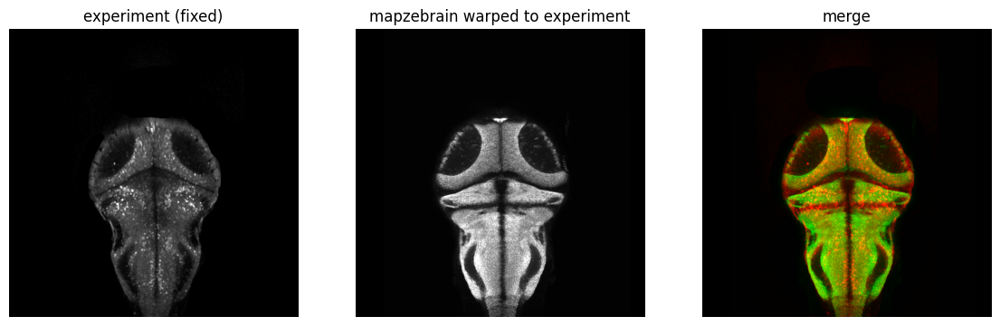

In [6]:
target_img = plot_img
for registered_image in registered_images:
	fig, ax = plt.subplots(1, 3, figsize=(14, 6))

	ax[0].imshow(
		target_img,
		cmap="gray",
		vmin=target_vmin,
		vmax=target_vmax,
	)
	ax[1].imshow(
		registered_image,
		cmap="gray",
		vmin=0,
		vmax=1000,
	)

	[a.axis("off") for a in ax]

	merge = np.zeros((target_img.shape[0], target_img.shape[1], 3))
	merge[:, :, 0] = 3 * target_img / max(float(target_img.max()), 1.0)
	merge[:, :, 1] = 1 * registered_image / max(float(registered_image.max()), 1.0)
	ax[-1].imshow(merge)

	ax[0].set_title("experiment (fixed)")
	ax[1].set_title("mapzebrain warped to experiment")
	ax[-1].set_title("merge")
	plt.show()

ELASTIX version: 5.0.1
Command line options from ElastixBase:
-out      /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_9dpf_DOI_50ugml_15_20250925/alignment_rev_plane0/
-threads  unspecified, so all available threads are used
-def      /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_9dpf_DOI_50ugml_15_20250925/alignment_rev_plane0/point_set.txt
-jac      unspecified, so no det(dT/dx) computed
-jacmat   unspecified, so no dT/dx computed
Calling all ReadFromFile()'s ...
  The default value "false" is used instead.
  The default value "false" is used instead.
  Calling all ReadFromFile()'s took 0.006536 s
Transforming points ...
  The transform is evaluated on some points, specified in the input point file.
  Reading input point file: /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_9dpf_DOI_50ugml_15_20250925/alignment_rev_plane0/point_set.txt
  Input points are specified in world coordinates.
  Number of specified input points: 813
  The input points are transformed.
  The transformed p

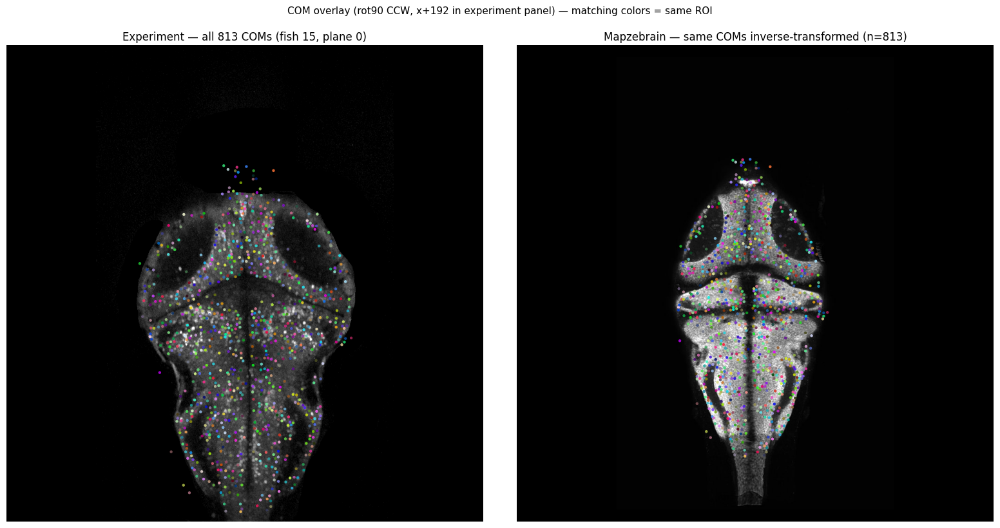

In [7]:
# Diagnostic: all ROI COMs for this fish/plane (`com_to_target_xy` → experiment / `plot_img` frame).
# After registration: same COMs inverse-transformed to mapzebrain (`source_img`). One row, two panels; each ROI gets a random RGB (same in both panels).
# Requires: `exp_folder`, `data_folder`, `source_img`, `plot_img`, registration output under `alignment_rev_plane*`.

W_EMBED = 1024
SHIFT_X_CURRENT = (1024 - 640) // 2

if "com_to_target_xy" not in globals():
    def com_to_target_xy(x, y):
        px, py = float(x), float(y)
        ox, oy = py, W_EMBED - 1 - px
        return (ox + SHIFT_X_CURRENT, oy)

if "fish_id" not in globals():
    fish_id = int(exp_folder.name.split("_")[-2])

_plane = int(globals().get("plane", globals().get("selected_plane", 0)))

_h5_candidates = [
    exp_folder / "temporal_pack_compact_clean.h5",
    data_folder / "temporal_pack_compact_clean.h5",
]
_h5 = next((p for p in _h5_candidates if p.is_file()), None)
if _h5 is None:
    raise FileNotFoundError(
        "temporal_pack_compact_clean.h5 not found. Tried:\n  "
        + "\n  ".join(str(p) for p in _h5_candidates)
    )

_tdf = df if "df" in globals() else pd.read_hdf(_h5, key="compact_temporal")
_roi_plane = _tdf[(_tdf["fish_id"] == fish_id) & (_tdf["plane"] == _plane)]


def _unpack_com(c):
    v = np.asarray(c, dtype=float).ravel()
    if v.size < 2:
        raise ValueError(f"COM must have at least 2 values, got {c!r}")
    return float(v[0]), float(v[1])


_all_pts = [com_to_target_xy(*_unpack_com(c)) for c in _roi_plane["com"]]

_tvmin = globals().get("target_vmin", 0)
_tvmax = globals().get("target_vmax", 1000)

if "plot_img" not in globals():
    raise ValueError(
        "No target image for overlay. Rerun the unaligned visualization cell (defines plot_img)."
    )
_tgt = plot_img

save_path = exp_folder.joinpath(f"alignment_rev_plane{_plane}")
if not save_path.is_dir():
    raise FileNotFoundError(
        f"Elastix output not found: {save_path}. Run the registration cell first (writes transform_pmap_*.txt)."
    )
mypoints = _all_pts
rev_points = sitkalignment.transform_points(Path(save_path), mypoints)

# Inverse-transformed COMs in mapzebrain (moving) coordinates — same column as the region-assignment cell.
_COM_MAP_COL = "com_aligned_mapzebrain"
if _COM_MAP_COL not in _tdf.columns:
    _tdf[_COM_MAP_COL] = pd.Series(index=_tdf.index, dtype=object)
for _ix, _rp in zip(_roi_plane.index, rev_points):
    _tdf.at[_ix, _COM_MAP_COL] = (float(_rp[0]), float(_rp[1]))
if "df" not in globals():
    df = _tdf

_src_vmax = globals().get("source_vmax", 1000)
_n = len(mypoints)
_rng = np.random.default_rng()
_pt_colors = _rng.random((_n, 3)) if _n else np.empty((0, 3))
xs_e = np.array([p[0] for p in mypoints], dtype=float)
ys_e = np.array([p[1] for p in mypoints], dtype=float)
xs_m = np.array([p[0] for p in rev_points], dtype=float)
ys_m = np.array([p[1] for p in rev_points], dtype=float)

fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(16, 8))
ax0.imshow(_tgt, cmap="gray", vmin=_tvmin, vmax=_tvmax)
ax0.scatter(xs_e, ys_e, c=_pt_colors, s=10, alpha=0.85, linewidths=0)
ax0.set_title(
    f"Experiment — all {len(mypoints)} COMs (fish {fish_id}, plane {_plane})"
)
ax0.axis("off")

ax1.imshow(source_img, cmap="gray", vmin=0, vmax=_src_vmax)
ax1.scatter(xs_m, ys_m, c=_pt_colors, s=10, alpha=0.85, linewidths=0)
ax1.set_title(f"Mapzebrain — same COMs inverse-transformed (n={len(rev_points)})")
ax1.axis("off")

fig.suptitle(
    f"COM overlay (rot90 CCW, x+{SHIFT_X_CURRENT} in experiment panel) — matching colors = same ROI",
    fontsize=11,
    y=1.02,
)
plt.tight_layout()
plt.show()


ELASTIX version: 5.0.1
Command line options from ElastixBase:
-out      /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_9dpf_DOI_50ugml_15_20250925/alignment_rev_plane0/
-threads  unspecified, so all available threads are used
-def      /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_9dpf_DOI_50ugml_15_20250925/alignment_rev_plane0/point_set.txt
-jac      unspecified, so no det(dT/dx) computed
-jacmat   unspecified, so no dT/dx computed
Calling all ReadFromFile()'s ...
  The default value "false" is used instead.
  The default value "false" is used instead.
  Calling all ReadFromFile()'s took 0.006612 s
Transforming points ...
  The transform is evaluated on some points, specified in the input point file.
  Reading input point file: /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_9dpf_DOI_50ugml_15_20250925/alignment_rev_plane0/point_set.txt
  Input points are specified in world coordinates.
  Number of specified input points: 20
  The input points are transformed.
  The transformed po

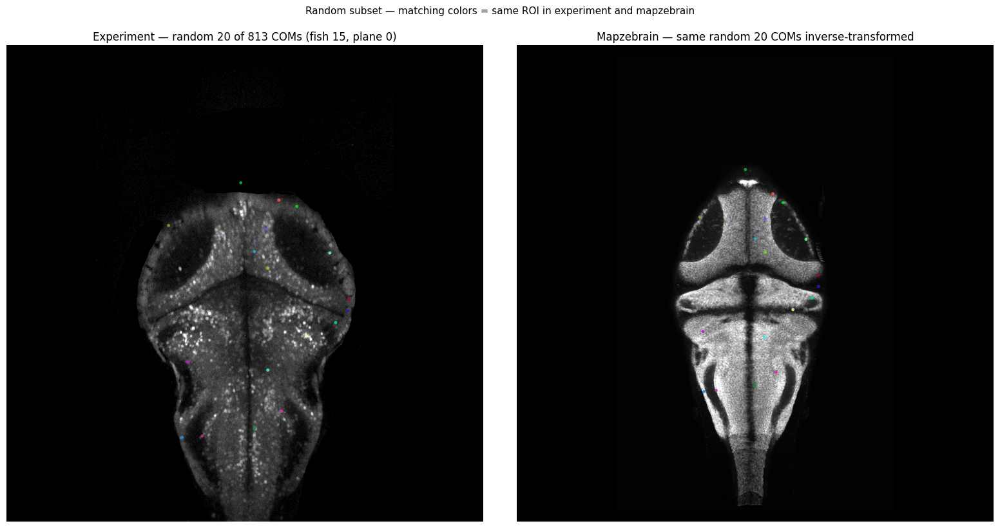

In [8]:
# Optional: random subset of the same ROI COMs (`_all_pts`) → inverse transform to mapzebrain.
# Run the all-COM diagnostic cell above first (defines `_all_pts`, `_plane`, `fish_id`, …).

n_random_points = 20

if "_all_pts" not in globals() or not _all_pts:
    raise ValueError(
        "Run the all-COM diagnostic cell above first — it defines `_all_pts`."
    )

_plane_r = int(globals().get("_plane", globals().get("plane", globals().get("selected_plane", 0))))
_k = min(int(n_random_points), len(_all_pts))
_ix = random.sample(range(len(_all_pts)), k=_k)
sample_pts = [_all_pts[i] for i in _ix]

save_path_r = exp_folder.joinpath(f"alignment_rev_plane{_plane_r}")
if not save_path_r.is_dir():
    raise FileNotFoundError(
        f"Elastix output not found: {save_path_r}. Run the registration cell first."
    )
rev_points_sample = sitkalignment.transform_points(Path(save_path_r), sample_pts)

_tvmin = globals().get("target_vmin", 0)
_tvmax = globals().get("target_vmax", 1000)
_src_vmax = globals().get("source_vmax", 1000)
_kn = len(sample_pts)
_rng_s = np.random.default_rng()
_pt_colors_s = _rng_s.random((_kn, 3)) if _kn else np.empty((0, 3))
xs_s = np.array([p[0] for p in sample_pts], dtype=float)
ys_s = np.array([p[1] for p in sample_pts], dtype=float)
xs_rs = np.array([p[0] for p in rev_points_sample], dtype=float)
ys_rs = np.array([p[1] for p in rev_points_sample], dtype=float)

fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(16, 8))
ax0.imshow(plot_img, cmap="gray", vmin=_tvmin, vmax=_tvmax)
ax0.scatter(xs_s, ys_s, c=_pt_colors_s, s=12, alpha=0.9, linewidths=0)
ax0.set_title(
    f"Experiment — random {len(sample_pts)} of {len(_all_pts)} COMs (fish {fish_id}, plane {_plane_r})"
)
ax0.axis("off")

ax1.imshow(source_img, cmap="gray", vmin=0, vmax=_src_vmax)
ax1.scatter(xs_rs, ys_rs, c=_pt_colors_s, s=12, alpha=0.9, linewidths=0)
ax1.set_title(
    f"Mapzebrain — same random {len(rev_points_sample)} COMs inverse-transformed"
)
ax1.axis("off")

fig.suptitle(
    "Random subset — matching colors = same ROI in experiment and mapzebrain",
    fontsize=11,
    y=1.02,
)
plt.tight_layout()
plt.show()


## Multi-plane ROIs with a **single** transform (reference plane)



Register **once** with the primary alignment cells so **`alignment_rev_plane{plane}/`** exists for your reference functional plane (usually `plane == 0`). The **same** inverse transform is applied to **every** ROI COM (`com_aligned_mapzebrain`), regardless of functional plane.



Per-plane **experiment images** come from **`mesmerize-batch/`** memmaps (same memmap source as `3_brain_alignment_elysia.ipynb`, but **rot90 k=1** and **× 2^10** here so experiment frames match the STD / `com_to_target_xy` convention used in this notebook).



**`EXPERIMENT_TO_MAPZEBRAIN_Z`** (next cell): declare which **functional plane** you want next to which **mapzebrain z** slice in the QC grid. Use a **list of `(exp_plane, atlas_z)` tuples** (row order = list order) or a **`dict`** `{exp_plane: atlas_z}` (row order = insertion order). That is how you tell the notebook which atlas image to plot for each experiment plane when checking that the single transform still looks reasonable across depth.



**Geometry note:** Elastix is 2D: inverse-transformed \((x,y)\) are strictly correct in the **atlas slice used as the moving image** during registration (typically `selected_mapzebrain_z`). On **other** z slices, the same \((x,y)\) are overlaid for **visual** comparison at the depth you pair by hand, not a separate 3D warp.



In [9]:
# Build `target_img_by_plane` from mesmerize CaImAn memmaps (no per-plane STD TIFFs).
# Uses a separate batch dataframe so we do not overwrite `df` from temporal_pack_compact_clean.h5.
ALIGNMENT_REFERENCE_PLANE = int(globals().get("plane", globals().get("selected_plane", 0)))
batch_path = exp_folder.joinpath("mesmerize-batch/batch.pickle")
if not batch_path.is_file():
    raise FileNotFoundError(f"Missing mesmerize batch pickle: {batch_path}")
_mbatch_df = pd.read_pickle(batch_path)
_mbatch_df = _mbatch_df[_mbatch_df["algo"] == "mcorr"]
uuid_to_plane = {}
plane_col = None
for candidate in ["plane", "z", "z_plane", "slice", "plane_idx", "plane_index"]:
    if candidate in _mbatch_df.columns:
        plane_col = candidate
        break
if plane_col is not None:
    uuid_to_plane.update(
        {
            str(row.uuid): int(row[plane_col])
            for _, row in _mbatch_df[["uuid", plane_col]].dropna().iterrows()
        }
    )
for _, row in _mbatch_df.iterrows():
    uid = str(row.uuid)
    if uid in uuid_to_plane:
        continue
    for field in ["item_name", "input_movie_path"]:
        if field not in _mbatch_df.columns:
            continue
        text = str(row[field])
        m = re.search(r"img_stack[_\-\s]?(\d+)", text, flags=re.IGNORECASE)
        if m:
            uuid_to_plane[uid] = int(m.group(1))
            break
filenames = set(_mbatch_df.uuid.astype(str))
target_items = []
with os.scandir(exp_folder.joinpath("mesmerize-batch")) as entries:
    for entry in entries:
        if entry.name in filenames:
            with os.scandir(entry.path) as subentries:
                for subentry in subentries:
                    if not subentry.name.endswith(".mmap") or subentry.name.startswith("._"):
                        continue
                    detected_plane = uuid_to_plane.get(entry.name)
                    if detected_plane is None:
                        m = re.search(
                            r"(?:^|[_\-\s])(plane|z|slice|img_stack)[_\-\s]?(\d+)(?:[_\-\s]|$)",
                            subentry.path,
                            flags=re.IGNORECASE,
                        )
                        if m:
                            detected_plane = int(m.group(2))
                    target_items.append((subentry.path, detected_plane, entry.name))
target_items.sort(
    key=lambda x: (
        x[1] is None,
        x[1] if x[1] is not None else 10**9,
        x[2],
        x[0],
    )
)
target_img_lst = []
target_img_by_plane = {}
plane_to_uuid = {}
for img_path, detected_plane, uid in target_items:
    img_stack = caiman_memmap_reader(img_path, mode="r")
    target_img = np.nanstd(img_stack, axis=0)
    m = float(np.nanmax(target_img))
    if m > 0:
        target_img = target_img / m
    target_img *= 2**10  # match STD / registration scaling in this notebook
    target_img = np.rot90(target_img, k=1)  # match `plot_img` + com_to_target_xy in cells above
    target_img = sitkalignment.embed_image(target_img, 1024)
    target_img_lst.append(target_img)
    if detected_plane is not None:
        target_img_by_plane[detected_plane] = target_img
        plane_to_uuid[detected_plane] = uid
print(f"Loaded {len(target_img_lst)} memmap projection(s); planes: {sorted(target_img_by_plane.keys())}")
_mapze_path = Path(
    globals().get("mapzebrain_img_path", Path(r"./reference_images/hindbrain/mapzebrain/T_AVG_HuCD.tif"))
)
with tifffile.TiffFile(_mapze_path) as _tf:
    _nz_atlas = int(_tf.series[0].shape[0])

Loaded 11 memmap projection(s); planes: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]


In [10]:
# --- edit: experiment functional plane -> mapzebrain z for that QC row (list order = row order) ---
EXPERIMENT_TO_MAPZEBRAIN_Z = [
    (0, 292),
    (1, 272),
    (2, 252),
    (3, 232),
    (4, 212),
    (5, 192),
    (6, 172),
    (7, 152),
    (8, 132),
    (9, 112),
    (10, 92),
]
if isinstance(EXPERIMENT_TO_MAPZEBRAIN_Z, dict):
    _qc_iter = list(EXPERIMENT_TO_MAPZEBRAIN_Z.items())
elif isinstance(EXPERIMENT_TO_MAPZEBRAIN_Z, (list, tuple)):
    _qc_iter = list(EXPERIMENT_TO_MAPZEBRAIN_Z)
else:
    raise TypeError(
        "EXPERIMENT_TO_MAPZEBRAIN_Z must be a list of (exp_plane, atlas_z) tuples or dict exp_plane -> atlas_z"
    )
_seen_ep = set()
EXPERIMENT_ATLAS_QC_PAIRS = []
for _item in _qc_iter:
    if isinstance(_item, tuple) and len(_item) == 2:
        _ep, _mz = int(_item[0]), int(_item[1])
    else:
        raise TypeError(f"Expected (exp_plane, atlas_z), got {_item!r}")
    if _ep in _seen_ep:
        raise ValueError(f"Duplicate experiment plane {_ep} in EXPERIMENT_TO_MAPZEBRAIN_Z")
    _seen_ep.add(_ep)
    if not (0 <= _mz < _nz_atlas):
        raise ValueError(f"atlas z {_mz} for experiment plane {_ep} out of range [0, {_nz_atlas})")
    if _ep not in target_img_by_plane:
        print(f"[WARN] experiment plane {_ep} not in target_img_by_plane — QC will skip this row")
    EXPERIMENT_ATLAS_QC_PAIRS.append((_ep, _mz))
# If EXPERIMENT_TO_MAPZEBRAIN_Z is empty, the QC cell falls back to sorted planes + selected_mapzebrain_z.
if not EXPERIMENT_ATLAS_QC_PAIRS:
    print(
        "[WARN] EXPERIMENT_TO_MAPZEBRAIN_Z produced no pairs; QC cell will fall back to sorted planes."
    )
_atlas_stack_holder = {"arr": None}
def atlas_slice_embedded(z):
    if _atlas_stack_holder["arr"] is None:
        _atlas_stack_holder["arr"] = tifffile.imread(str(_mapze_path))
    stack = _atlas_stack_holder["arr"]
    s = np.asarray(stack[int(z)], dtype=np.float64)
    s = sitkalignment.embed_image(s, 1024)
    mx = float(np.max(s))
    if mx > 0:
        s = s / mx
    return s * (2**10)


In [11]:
# Single Elastix folder for all planes (inverse transform ROI COMs with this path).
ALIGNMENT_SAVE_PATH = exp_folder.joinpath(f"alignment_rev_plane{ALIGNMENT_REFERENCE_PLANE}")
if not ALIGNMENT_SAVE_PATH.is_dir():
    raise FileNotFoundError(
        f"Expected registration output at {ALIGNMENT_SAVE_PATH}. "
        "Run the primary `register_image2` cell for the reference plane first."
    )
print("ROI inverse-transform uses:", ALIGNMENT_SAVE_PATH.resolve())

ROI inverse-transform uses: /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_9dpf_DOI_50ugml_15_20250925/alignment_rev_plane0


ELASTIX version: 5.0.1
Command line options from ElastixBase:
-out      /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_9dpf_DOI_50ugml_15_20250925/alignment_rev_plane0/
-threads  unspecified, so all available threads are used
-def      /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_9dpf_DOI_50ugml_15_20250925/alignment_rev_plane0/point_set.txt
-jac      unspecified, so no det(dT/dx) computed
-jacmat   unspecified, so no dT/dx computed
Calling all ReadFromFile()'s ...
  The default value "false" is used instead.
  The default value "false" is used instead.
  Calling all ReadFromFile()'s took 0.008613 s
Transforming points ...
  The transform is evaluated on some points, specified in the input point file.
  Reading input point file: /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_9dpf_DOI_50ugml_15_20250925/alignment_rev_plane0/point_set.txt
  Input points are specified in world coordinates.
  Number of specified input points: 813
  The input points are transformed.
  The transformed p

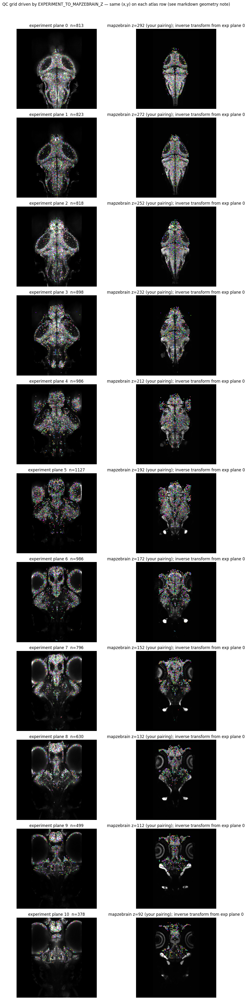

In [12]:
# QC: experiment plane (memmap) | atlas slice you paired for that plane. Same inverse transform for all COMs.
if "target_img_by_plane" not in globals() or not target_img_by_plane:
    raise RuntimeError("Run the mesmerize memmap cell above first.")
if "ALIGNMENT_SAVE_PATH" not in globals():
    raise RuntimeError("Run the alignment path check cell above first.")
W_EMBED = 1024
SHIFT_X_CURRENT = (1024 - 640) // 2
if "com_to_target_xy" not in globals():
    def com_to_target_xy(x, y):
        px, py = float(x), float(y)
        ox, oy = py, W_EMBED - 1 - px
        return (ox + SHIFT_X_CURRENT, oy)
_fish_id_q = int(exp_folder.name.split("_")[-2])
_h5c = [
    exp_folder / "temporal_pack_compact_clean.h5",
    globals().get("data_folder", exp_folder.parent) / "temporal_pack_compact_clean.h5",
]
_h5c = [Path(x) for x in _h5c]
_h5q = next((p for p in _h5c if p.is_file()), None)
if _h5q is None:
    raise FileNotFoundError("temporal_pack_compact_clean.h5 not found for QC.")
_dfq = df if "df" in globals() else pd.read_hdf(_h5q, key="compact_temporal")
_fishq = _dfq[_dfq["fish_id"] == _fish_id_q]
def _unpack_com_q(c):
    v = np.asarray(c, dtype=float).ravel()
    if v.size < 2:
        raise ValueError(f"COM must have at least 2 values, got {c!r}")
    return float(v[0]), float(v[1])
if EXPERIMENT_ATLAS_QC_PAIRS:
    _qc_rows = [(int(ep), int(mz)) for ep, mz in EXPERIMENT_ATLAS_QC_PAIRS if ep in target_img_by_plane]
else:
    _planes_fb = sorted(
        p for p in target_img_by_plane.keys() if p in set(_fishq["plane"].unique())
    ) or sorted(target_img_by_plane.keys())
    _z0 = int(globals().get("QC_ATLAS_Z_SLICES", globals().get("selected_mapzebrain_z", 292)))
    if isinstance(_z0, (list, tuple)):
        _z0 = int(_z0[0])
    _qc_rows = [(p, _z0) for p in _planes_fb]
if not _qc_rows:
    raise ValueError("No QC rows: check EXPERIMENT_TO_MAPZEBRAIN_Z and target_img_by_plane.")
_tvmin = globals().get("target_vmin", 0)
_tvmax = globals().get("target_vmax", 1000)
_svmax = globals().get("source_vmax", 1000)
# Memmap STD projections are often displayed a bit dark — lower ceiling if needed.
_evmin = float(globals().get("QC_EXPERIMENT_VMIN", _tvmin))
_evmax = float(globals().get("QC_EXPERIMENT_VMAX", min(float(_tvmax), 380.0)))
_rng = np.random.default_rng(42)
_n = len(_qc_rows)
_fig, _ax = plt.subplots(_n, 2, figsize=(12, 3.8 * _n))
if _n == 1:
    _ax = np.asarray([_ax])
for _i, (_pl, _mz) in enumerate(_qc_rows):
    _sub = _fishq[_fishq["plane"] == _pl]
    _tgt = target_img_by_plane[_pl]
    _src = atlas_slice_embedded(_mz)
    _pts = [com_to_target_xy(*_unpack_com_q(c)) for c in _sub["com"]]
    _outs = sitkalignment.transform_points(Path(ALIGNMENT_SAVE_PATH), _pts) if _pts else []
    _k = len(_outs)
    _col = _rng.random((_k, 3)) if _k else np.empty((0, 3))
    _xy_e = np.array(_pts, dtype=float) if _k else np.empty((0, 2))
    _xy_m = np.array(_outs, dtype=float) if _k else np.empty((0, 2))
    _ax[_i, 0].imshow(_tgt, cmap="gray", vmin=_evmin, vmax=_evmax)
    if _k:
        _ax[_i, 0].scatter(_xy_e[:, 0], _xy_e[:, 1], c=_col, s=5, alpha=0.85, linewidths=0)
    _ax[_i, 0].set_title(f"experiment plane {_pl}  n={len(_sub)}")
    _ax[_i, 0].axis("off")
    _ax[_i, 1].imshow(_src, cmap="gray", vmin=0, vmax=_svmax)
    if _k:
        _ax[_i, 1].scatter(_xy_m[:, 0], _xy_m[:, 1], c=_col, s=5, alpha=0.85, linewidths=0)
    _ax[_i, 1].set_title(
        f"mapzebrain z={_mz} (your pairing); inverse transform from exp plane {ALIGNMENT_REFERENCE_PLANE}"
    )
    _ax[_i, 1].axis("off")
plt.suptitle(
    "QC grid driven by EXPERIMENT_TO_MAPZEBRAIN_Z — same (x,y) on each atlas row (see markdown geometry note)",
    y=1.01,
)
plt.tight_layout()
plt.show()


ELASTIX version: 5.0.1
Command line options from ElastixBase:
-out      /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_9dpf_DOI_50ugml_15_20250925/alignment_rev_plane0/
-threads  unspecified, so all available threads are used
-def      /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_9dpf_DOI_50ugml_15_20250925/alignment_rev_plane0/point_set.txt
-jac      unspecified, so no det(dT/dx) computed
-jacmat   unspecified, so no dT/dx computed
Calling all ReadFromFile()'s ...
  The default value "false" is used instead.
  The default value "false" is used instead.
  Calling all ReadFromFile()'s took 0.006659 s
Transforming points ...
  The transform is evaluated on some points, specified in the input point file.
  Reading input point file: /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_9dpf_DOI_50ugml_15_20250925/alignment_rev_plane0/point_set.txt
  Input points are specified in world coordinates.
  Number of specified input points: 50
  The input points are transformed.
  The transformed po

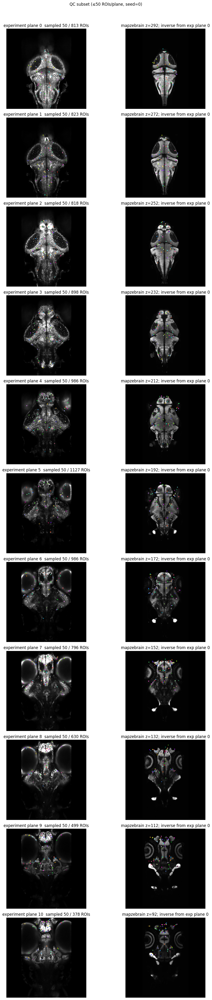

In [13]:
# QC subset: same grid as full QC, but at most N random ROIs per plane (same ALIGNMENT_SAVE_PATH inverse transform).
N_ROIS_SUBSAMPLE_PER_PLANE = 50
QC_SUBSAMPLE_SEED = 0
if "target_img_by_plane" not in globals() or not target_img_by_plane:
    raise RuntimeError("Run the mesmerize / mapping cells above first.")
if "ALIGNMENT_SAVE_PATH" not in globals():
    raise RuntimeError("Run the alignment path check cell above first.")
if "atlas_slice_embedded" not in globals():
    raise RuntimeError("Run the EXPERIMENT_TO_MAPZEBRAIN_Z cell (defines atlas_slice_embedded) first.")
W_EMBED = 1024
SHIFT_X_CURRENT = (1024 - 640) // 2
if "com_to_target_xy" not in globals():
    def com_to_target_xy(x, y):
        px, py = float(x), float(y)
        ox, oy = py, W_EMBED - 1 - px
        return (ox + SHIFT_X_CURRENT, oy)
_fish_id_q = int(exp_folder.name.split("_")[-2])
_h5c = [
    exp_folder / "temporal_pack_compact_clean.h5",
    globals().get("data_folder", exp_folder.parent) / "temporal_pack_compact_clean.h5",
]
_h5c = [Path(x) for x in _h5c]
_h5q = next((p for p in _h5c if p.is_file()), None)
if _h5q is None:
    raise FileNotFoundError("temporal_pack_compact_clean.h5 not found for QC.")
_dfq = df if "df" in globals() else pd.read_hdf(_h5q, key="compact_temporal")
_fishq = _dfq[_dfq["fish_id"] == _fish_id_q]
def _unpack_com_q(c):
    v = np.asarray(c, dtype=float).ravel()
    if v.size < 2:
        raise ValueError(f"COM must have at least 2 values, got {c!r}")
    return float(v[0]), float(v[1])
if EXPERIMENT_ATLAS_QC_PAIRS:
    _qc_rows_s = [(int(ep), int(mz)) for ep, mz in EXPERIMENT_ATLAS_QC_PAIRS if ep in target_img_by_plane]
else:
    _planes_fb = sorted(
        p for p in target_img_by_plane.keys() if p in set(_fishq["plane"].unique())
    ) or sorted(target_img_by_plane.keys())
    _z0 = int(globals().get("QC_ATLAS_Z_SLICES", globals().get("selected_mapzebrain_z", 292)))
    if isinstance(_z0, (list, tuple)):
        _z0 = int(_z0[0])
    _qc_rows_s = [(p, _z0) for p in _planes_fb]
if not _qc_rows_s:
    raise ValueError("No QC rows: check EXPERIMENT_TO_MAPZEBRAIN_Z and target_img_by_plane.")
_tvmin = globals().get("target_vmin", 0)
_tvmax = globals().get("target_vmax", 1000)
_svmax = globals().get("source_vmax", 1000)
_evmin = float(globals().get("QC_EXPERIMENT_VMIN", _tvmin))
_evmax = float(globals().get("QC_EXPERIMENT_VMAX", min(float(_tvmax), 380.0)))
_n = len(_qc_rows_s)
_fig, _ax = plt.subplots(_n, 2, figsize=(12, 3.8 * _n))
if _n == 1:
    _ax = np.asarray([_ax])
_ss = random.Random(QC_SUBSAMPLE_SEED) if QC_SUBSAMPLE_SEED is not None else random.Random()
_col_rng = np.random.default_rng(int(QC_SUBSAMPLE_SEED) if QC_SUBSAMPLE_SEED is not None else None)
for _i, (_pl, _mz) in enumerate(_qc_rows_s):
    _sub = _fishq[_fishq["plane"] == _pl]
    _idx = list(_sub.index)
    _take = min(int(N_ROIS_SUBSAMPLE_PER_PLANE), len(_idx))
    if _take < len(_idx):
        _idx = _ss.sample(_idx, k=_take)
    _sub_s = _sub.loc[_idx]
    _tgt = target_img_by_plane[_pl]
    _src = atlas_slice_embedded(_mz)
    _pts = [com_to_target_xy(*_unpack_com_q(c)) for c in _sub_s["com"]]
    _outs = sitkalignment.transform_points(Path(ALIGNMENT_SAVE_PATH), _pts) if _pts else []
    _k = len(_outs)
    _col = _col_rng.random((_k, 3)) if _k else np.empty((0, 3))
    _xy_e = np.array(_pts, dtype=float) if _k else np.empty((0, 2))
    _xy_m = np.array(_outs, dtype=float) if _k else np.empty((0, 2))
    _ax[_i, 0].imshow(_tgt, cmap="gray", vmin=_evmin, vmax=_evmax)
    if _k:
        _ax[_i, 0].scatter(_xy_e[:, 0], _xy_e[:, 1], c=_col, s=8, alpha=0.9, linewidths=0)
    _ax[_i, 0].set_title(f"experiment plane {_pl}  sampled {_k} / {len(_sub)} ROIs")
    _ax[_i, 0].axis("off")
    _ax[_i, 1].imshow(_src, cmap="gray", vmin=0, vmax=_svmax)
    if _k:
        _ax[_i, 1].scatter(_xy_m[:, 0], _xy_m[:, 1], c=_col, s=8, alpha=0.9, linewidths=0)
    _ax[_i, 1].set_title(
        f"mapzebrain z={_mz}; inverse from exp plane {ALIGNMENT_REFERENCE_PLANE}"
    )
    _ax[_i, 1].axis("off")
plt.suptitle(
    f"QC subset (≤{N_ROIS_SUBSAMPLE_PER_PLANE} ROIs/plane, seed={QC_SUBSAMPLE_SEED!r})",
    y=1.01,
)
plt.tight_layout()
plt.show()


### Save inverse-transformed COMs to `temporal_pack_compact_clean.h5` (side table)

Writes a small side table **`/com_aligned`** into the pack file — the big **`/compact_temporal`** trace table is **never read or rewritten** (same efficient pattern as the fish21 notebook). Per ROI it stores **`com_aligned_mapzebrain`** (the reference-plane Elastix inverse transform of each ROI's `com` into the mapzebrain frame). **No 3D atlas voxel is computed for this fish.**

Requires **`ALIGNMENT_SAVE_PATH`** and **`com_to_target_xy`** from the cells above, plus the in-memory **`df`** (ROI table) as the COM source.

If **`FISH_ROI_REGIONS`** exists from the region-assignment cell, the same pass also writes **`region_aligned_mapzebrain`** (list of region labels containing the COM) and **`single_region`** (first priority-stem hit). Each run replaces only **this** fish's rows in `/com_aligned`, leaving the other fish untouched.

In [18]:
# --- Persist single-transform inverse COMs (+ regions) to temporal_pack_compact_clean.h5 (EFFICIENT) ---
# fish15 uses ONE reference-plane transform (ALIGNMENT_SAVE_PATH) for every ROI, and we do NOT
# compute 3D atlas voxels for this fish (no oblique/voxel step). As in the fish21 notebook, we
# DON'T read or rewrite the big /compact_temporal trace table. We only write a small side table
# `/com_aligned` into the SAME file. Per ROI:
#   * com_aligned_mapzebrain    -> reference-plane inverse transform (x, y) in mapzebrain frame
#   * region_aligned_mapzebrain -> list of canonical region labels   (if region cell ran)
#   * single_region             -> first priority region label        (if region cell ran)
# Merge it back on load with the helper printed at the bottom.

if "com_to_target_xy" not in globals():
    raise RuntimeError("com_to_target_xy missing — run the COM-overlay cell that defines it.")
if "ALIGNMENT_SAVE_PATH" not in globals():
    raise RuntimeError("Run the alignment path cell so ALIGNMENT_SAVE_PATH is defined.")

COM_MAPZEBRAIN_COL = "com_aligned_mapzebrain"
REGION_LIST_COL = "region_aligned_mapzebrain"
SINGLE_REGION_COL = "single_region"
SIDE_KEY = "com_aligned"

_pack_candidates = [
    exp_folder / "temporal_pack_compact_clean.h5",
    Path(str(globals().get("data_folder", exp_folder.parent))) / "temporal_pack_compact_clean.h5",
]
pack_path = next((p for p in _pack_candidates if p.is_file()), None)
if pack_path is None:
    raise FileNotFoundError("temporal_pack_compact_clean.h5 not found.")
pack_path = Path(pack_path).resolve()

fish_id = int(exp_folder.name.split("_")[-2])
_src = df if "df" in globals() else None
if _src is None:
    raise RuntimeError("ROI dataframe (df) not loaded — run the COM cell that builds df first.")

# Region labels: prefer FISH_ROI_REGIONS, else df columns, else skip (COMs only).
_region_src = None
if "FISH_ROI_REGIONS" in globals() and SINGLE_REGION_COL in FISH_ROI_REGIONS.columns:
    _region_src = FISH_ROI_REGIONS
elif SINGLE_REGION_COL in getattr(_src, "columns", []):
    _region_src = _src
_have_regions = _region_src is not None
print(
    f"regions: {'INCLUDED from ' + ('FISH_ROI_REGIONS' if _region_src is FISH_ROI_REGIONS else 'df') if _have_regions else 'NOT found -> run region cell to add them'}"
)


def _region_vals(_ix):
    if not _have_regions or _ix not in _region_src.index:
        return ([], None)
    rl = _region_src.at[_ix, REGION_LIST_COL] if REGION_LIST_COL in _region_src.columns else None
    sg = _region_src.at[_ix, SINGLE_REGION_COL]
    rl = list(rl) if isinstance(rl, (list, tuple)) else []
    sg = None if (sg is None or (isinstance(sg, float) and np.isnan(sg))) else str(sg)
    return (rl, sg)


def _unpack_com_save(c):
    v = np.asarray(c, dtype=float).ravel()
    if v.size < 2:
        raise ValueError(f"COM must have at least 2 values, got {c!r}")
    return float(v[0]), float(v[1])


# Experiment-frame (x, y) for every ROI of this fish, keeping the pack row index.
_sub = _src[_src["fish_id"] == fish_id]
_idx, _pts = [], []
for _ix, c in _sub["com"].items():
    _idx.append(int(_ix))
    _pts.append(com_to_target_xy(*_unpack_com_save(c)))

# Single reference-plane inverse transform -> mapzebrain (moving) coords. No voxel step.
_mapped = sitkalignment.transform_points(Path(ALIGNMENT_SAVE_PATH), _pts) if _pts else []

_rows = []
for _ix, p in zip(_idx, _mapped):
    r = _src.loc[_ix]
    _rl, _sg = _region_vals(_ix)
    _rows.append(
        {
            "pack_index": _ix,
            "fish_id": fish_id,
            "plane": int(r["plane"]) if "plane" in _src.columns else -1,
            "neuron": int(r["neuron"]) if "neuron" in _src.columns else -1,
            "roi_index": int(r["roi_index"]) if "roi_index" in _src.columns else -1,
            COM_MAPZEBRAIN_COL: (float(p[0]), float(p[1])),
            REGION_LIST_COL: _rl,
            SINGLE_REGION_COL: _sg,
        }
    )

aligned_tbl = pd.DataFrame(_rows)
print(f"computed {len(aligned_tbl)} rows for fish {fish_id} (COMs"
      f"{' + regions' if _have_regions else ''}; no voxels)")

# Merge with any previously-saved fish in /com_aligned, replacing this fish's rows.
with pd.HDFStore(pack_path, "r") as _st:
    _has_side = ("/" + SIDE_KEY) in _st.keys()
if _has_side:
    _prev = pd.read_hdf(pack_path, key=SIDE_KEY)
    for _c in (REGION_LIST_COL, SINGLE_REGION_COL):
        if _c not in _prev.columns:
            _prev[_c] = pd.Series([None] * len(_prev), index=_prev.index, dtype=object)
    _prev = _prev[_prev["fish_id"] != fish_id]
    out_tbl = pd.concat([_prev, aligned_tbl], ignore_index=True)
else:
    out_tbl = aligned_tbl

# Write ONLY the small side table; /compact_temporal is never read or rewritten.
out_tbl.to_hdf(pack_path, key=SIDE_KEY, mode="a", format="fixed")

# Keep the in-memory df in sync.
if "df" in globals():
    _cols = [COM_MAPZEBRAIN_COL]
    if _have_regions:
        _cols += [REGION_LIST_COL, SINGLE_REGION_COL]
    for _col in _cols:
        if _col not in df.columns:
            df[_col] = pd.Series(index=df.index, dtype=object)
    for _, _r in aligned_tbl.iterrows():
        _ix = _r["pack_index"]
        if _ix in df.index:
            for _col in _cols:
                df.at[_ix, _col] = _r[_col]

print(
    f"wrote /{SIDE_KEY} -> {pack_path}\n"
    f"  fish {fish_id}: {len(aligned_tbl)} rows | side table now {len(out_tbl)} rows total | "
    f"/compact_temporal untouched"
)
print(
    "\n# load the compact pack WITH the aligned COMs / regions attached:\n"
    "#   base = pd.read_hdf(pack_path, key='compact_temporal')\n"
    "#   side = pd.read_hdf(pack_path, key='com_aligned').set_index('pack_index')\n"
    "#   for c in ['com_aligned_mapzebrain','region_aligned_mapzebrain','single_region']:\n"
    "#       if c in side.columns: base[c] = side[c]"
)

regions: INCLUDED from FISH_ROI_REGIONS
ELASTIX version: 5.0.1
Command line options from ElastixBase:
-out      /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_9dpf_DOI_50ugml_15_20250925/alignment_rev_plane0/
-threads  unspecified, so all available threads are used
-def      /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_9dpf_DOI_50ugml_15_20250925/alignment_rev_plane0/point_set.txt
-jac      unspecified, so no det(dT/dx) computed
-jacmat   unspecified, so no dT/dx computed
Calling all ReadFromFile()'s ...
  The default value "false" is used instead.
  The default value "false" is used instead.
  Calling all ReadFromFile()'s took 0.005846 s
Transforming points ...
  The transform is evaluated on some points, specified in the input point file.
  Reading input point file: /Volumes/Kobi/DOI_animals_good/elavl3H2BGCaMP6s_9dpf_DOI_50ugml_15_20250925/alignment_rev_plane0/point_set.txt
  Input points are specified in world coordinates.
  Number of specified input points: 8754
  The input po

/var/folders/5s/q3x21d8j6jvcnr7nmcb5xkwr0000gn/T/ipykernel_72879/2505079272.py:109: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block1_values] [items->Index(['com_aligned_mapzebrain', 'atlas_voxel_mapzebrain',
       'region_aligned_mapzebrain', 'single_region'],
      dtype='object')]

  out_tbl.to_hdf(pack_path, key=SIDE_KEY, mode="a", format="fixed")


wrote /com_aligned -> /Volumes/Kobi/DOI_animals_good/temporal_pack_compact_clean.h5
  fish 15: 8754 rows | side table now 113893 rows total | /compact_temporal untouched

# load the compact pack WITH the aligned COMs / regions attached:
#   base = pd.read_hdf(pack_path, key='compact_temporal')
#   side = pd.read_hdf(pack_path, key='com_aligned').set_index('pack_index')
#   for c in ['com_aligned_mapzebrain','region_aligned_mapzebrain','single_region']:
#       if c in side.columns: base[c] = side[c]


### Region labels (mapzebrain masks)

The next cell loads **every** multi-page TIFF under `MASKS_FOLDER` (stack index = atlas z). It slices at each **`EXPERIMENT_ATLAS_QC_PAIRS`** atlas z, optionally crops like `hindbrain_alignment_to_mapzebrain.ipynb`, **embeds** to 1024 to match **`com_aligned_mapzebrain`** (must already exist on the ROI table from the COM persist step). For each ROI it builds:

- **`region_aligned_mapzebrain`**: a Python **list** of canonical region names for **every** mask file in the folder whose positive voxels contain that ROI’s inverse-transformed COM (sorted mask order: filename stem, then path; duplicates removed; stems mapped with **`REGION_STEM_TO_CANONICAL`**).

- **`single_region`**: exactly **one** label — the first mask in **`REGION_MASK_PRIORITY_STEMS`** (that exists on disk) whose embedded slice contains the COM. Only those priority stems can win; labels use the same canonical mapping.

**`FISH_ROI_REGIONS`** holds the per-fish slice in memory; run the **persist** cell to write `com_aligned_mapzebrain`, `region_aligned_mapzebrain`, and `single_region` into **`temporal_pack_compact_clean.h5`** for overlapping indices.


Run the memmap + `EXPERIMENT_TO_MAPZEBRAIN_Z` cell first so `EXPERIMENT_ATLAS_QC_PAIRS` exists. Ensure `ALIGNMENT_SAVE_PATH` was run so COMs can be inverse-transformed if needed.


In [15]:
# Assign ROIs to mapzebrain regions (in-memory; mirrored onto `df` if present).
# Requires **`com_aligned_mapzebrain`** on the ROI table (run the COM persist / alignment cell first).
# Builds **`region_aligned_mapzebrain`**: list of canonical labels for every mask TIFF under MASKS_FOLDER
# whose embedded slice contains the COM (sorted by stem, then path; duplicates suppressed).
# Builds **`single_region`**: first matching mask in **`REGION_MASK_PRIORITY_STEMS`** only (canonical label).
# Run the **persist** cell afterward to write these columns into `temporal_pack_compact_clean.h5` when `FISH_ROI_REGIONS` is available.

MASKS_FOLDER = Path(r"/Volumes/Kobi/DOI_animals_good/mapZebrain__regions__v2.0.1")
MASK_GLOB = "*.tif"
# If masks live in subfolders, keep True. Set False to only scan the top level of MASKS_FOLDER.
MASK_RECURSIVE = True
# Optional: warn if we do not find this many mask files on disk (set None to skip).
EXPECTED_MASK_COUNT = 114
# Masks are walked in this order for `single_region` only (first hit wins). Stems must match TIFF filenames without extension.
# Duplicate `posterior_tuberculum_(...)` from the atlas list is included only once.
REGION_MASK_PRIORITY_STEMS = [
    "olfactory_bulb",
    "dorsal_telencephalon_(pallium)",
    "ventral_telencephalon_(subpallium)",
    "rostral_hypothalamus",
    "intermediate_hypothalamus_(entire)",
    "caudal_hypothalamus",
    "pituitary",
    "preoptic_region",
    "hypothalamus",
    "posterior_tuberculum_(basal_part_of_prethalamus_and_thalamus)",
    "retina",
    "eminentia_thalami",
    "prethalamus_(ventral_thalamus)",
    "epiphysis",
    "habenula",
    "thalamus_(dorsal_thalamus)",
    "pretectum",
    "prosencephalon_(forebrain)",
    "oculomotor_nucleus",
    "tegmentum",
    "torus_longitudinalis",
    "tectal_neuropil",
    "periventricular_layer",
    "torus_semicircularis",
    "cerebellum",
    "medial_octavolateralis_nucleus",
    "superior_dorsal_medulla_oblongata",
    "anterior_(dorsal)_trigeminal_motor_nucleus",
    "superior_raphe",
    "interpeduncular_nucleus",
    "locus_coeruleus",
    "posterior_(ventral)_trigeminal_motor_nucleus",
    "nucleus_isthmi",
    "superior_ventral_medulla_oblongata_(entire)",
    "facial_motor_nucleus",
    "abducens_motor_nucleus",
    "intermediate_ventral_medulla_oblongata_(entire)",
    "intermediate_dorsal_medulla_oblongata",
    "vagus_motor_nucleus",
    "area_postrema",
    "vagal_sensory_lobe",
    "inferior_dorsal_medulla_oblongata",
    "inferior_olive",
    "inferior_raphe",
    "lateral_reticular_nucleus",
    "inferior_ventral_medulla_oblongata_(entire)",
    "olfactory_epithelium",
    "anterior_lateral_line_ganglion",
    "trigeminal_ganglion",
    "posterior_lateral_line_ganglion",
    "octaval_ganglion",
    "glossopharyngeal_ganglion",
]
# Map specific mask stems → single label stored on each ROI (unlisted stems use the filename stem).
REGION_STEM_TO_CANONICAL = {
    "superior_dorsal_medulla_oblongata": "dorsal_medulla_oblongata",
    "intermediate_dorsal_medulla_oblongata": "dorsal_medulla_oblongata",
    "inferior_dorsal_medulla_oblongata": "dorsal_medulla_oblongata",
    "superior_ventral_medulla_oblongata_(entire)": "ventral_medulla_oblongata",
    "intermediate_ventral_medulla_oblongata_(entire)": "ventral_medulla_oblongata",
    "inferior_ventral_medulla_oblongata_(entire)": "ventral_medulla_oblongata",
}
ATLAS_MASK_ROW_SLICE = slice(None, None, None)
ATLAS_MASK_COL_SLICE = slice(None, None, None)

COM_ALIGNED_COL = "com_aligned_mapzebrain"
REGION_LIST_COLUMN = "region_aligned_mapzebrain"  # list[str]
SINGLE_REGION_COLUMN = "single_region"  # str | None

W_EMBED = 1024
SHIFT_X_CURRENT = (1024 - 640) // 2
if "EXPERIMENT_ATLAS_QC_PAIRS" not in globals() or not EXPERIMENT_ATLAS_QC_PAIRS:
    raise RuntimeError("Run the EXPERIMENT_TO_MAPZEBRAIN_Z cell so EXPERIMENT_ATLAS_QC_PAIRS is defined.")
if "ALIGNMENT_SAVE_PATH" not in globals():
    raise RuntimeError("Run the alignment path check cell (ALIGNMENT_SAVE_PATH).")
if "com_to_target_xy" not in globals():
    def com_to_target_xy(x, y):
        px, py = float(x), float(y)
        ox, oy = py, W_EMBED - 1 - px
        return (ox + SHIFT_X_CURRENT, oy)


def _unpack_com(c):
    v = np.asarray(c, dtype=float).ravel()
    if v.size < 2:
        raise ValueError(f"COM must have at least 2 values, got {c!r}")
    return float(v[0]), float(v[1])


_fish_id = int(exp_folder.name.split("_")[-2])
_h5_candidates = [
    exp_folder / "temporal_pack_compact_clean.h5",
    Path(globals().get("data_folder", exp_folder.parent)) / "temporal_pack_compact_clean.h5",
]
_h5_path = next((p for p in _h5_candidates if p.is_file()), None)
if _h5_path is None:
    raise FileNotFoundError("temporal_pack_compact_clean.h5 not found. Tried:\n  " + "\n  ".join(str(x) for x in _h5_candidates))
with pd.HDFStore(_h5_path, "r") as _st:
    _h5_keys = [k.lstrip("/") for k in _st.keys()]
# Trace/ROI metadata is in /compact_temporal (file also has /com_aligned side table).
_h5_key = "compact_temporal" if "compact_temporal" in _h5_keys else _h5_keys[0]
_df = pd.read_hdf(_h5_path, key=_h5_key)
_fish = _df[_df["fish_id"] == _fish_id].copy()

# `com_aligned_mapzebrain` now lives in the /com_aligned side table (the persist cell writes it
# there), NOT in /compact_temporal. Attach it to `_fish` so region assignment can read each COM.
if COM_ALIGNED_COL not in _fish.columns or _fish[COM_ALIGNED_COL].isna().all():
    _com_src = None
    if "com_aligned" in _h5_keys:
        _side = pd.read_hdf(_h5_path, key="com_aligned")
        _side = _side[_side["fish_id"] == _fish_id]
        if "pack_index" in _side.columns:
            _side = _side.set_index("pack_index")
        if COM_ALIGNED_COL in _side.columns and len(_side):
            _com_src = _side[COM_ALIGNED_COL]
    if _com_src is None and "df" in globals() and COM_ALIGNED_COL in getattr(df, "columns", []):
        _com_src = df[COM_ALIGNED_COL]
    if _com_src is not None:
        _fish[COM_ALIGNED_COL] = _com_src.reindex(_fish.index)

if COM_ALIGNED_COL not in _fish.columns:
    raise RuntimeError(
        f"Missing column {COM_ALIGNED_COL!r}. Populate inverse-transformed COMs (persist / alignment cell) before region assignment."
    )
_n_missing_com = int(_fish[COM_ALIGNED_COL].isna().sum())
if _n_missing_com == len(_fish):
    raise RuntimeError(
        f"All ROI rows lack {COM_ALIGNED_COL!r}. Run the COM persist / alignment step first."
    )
if _n_missing_com:
    print(
        f"[WARN] {_n_missing_com} / {len(_fish)} ROIs have no {COM_ALIGNED_COL}; "
        "skipping region tests for those rows."
    )

_fish[REGION_LIST_COLUMN] = pd.Series([[] for _ in range(len(_fish))], index=_fish.index, dtype=object)
_fish[SINGLE_REGION_COLUMN] = pd.Series([None] * len(_fish), index=_fish.index, dtype=object)

if not MASKS_FOLDER.is_dir():
    raise FileNotFoundError(f"MASKS_FOLDER not found: {MASKS_FOLDER.resolve()}")
_mask_paths = []
_iter = MASKS_FOLDER.rglob("*") if MASK_RECURSIVE else MASKS_FOLDER.glob("*")
for _p in _iter:
    if not _p.is_file():
        continue
    if _p.name.startswith(".") or _p.name.startswith("._"):
        continue
    _ln = _p.name.lower()
    if not (_ln.endswith(".tif") or _ln.endswith(".tiff")):
        continue
    _mask_paths.append(_p)
_mask_paths = sorted(set(_mask_paths), key=lambda q: str(q).lower())
print(f"Mask TIFFs found on disk: {len(_mask_paths)} (recursive={MASK_RECURSIVE}) under {MASKS_FOLDER}")
if EXPECTED_MASK_COUNT is not None and len(_mask_paths) < EXPECTED_MASK_COUNT:
    print(
        f"[WARN] Found {len(_mask_paths)} < EXPECTED_MASK_COUNT={EXPECTED_MASK_COUNT}. "
        "Check MASKS_FOLDER, MASK_RECURSIVE, and file extensions."
    )
if not _mask_paths:
    raise FileNotFoundError(f"No .tif/.tiff masks under {MASKS_FOLDER}")
_stem_to_path = {_p.stem: _p for _p in _mask_paths}
_ordered_mask_paths = []
for _stem in REGION_MASK_PRIORITY_STEMS:
    _p = _stem_to_path.get(_stem)
    if _p is not None:
        _ordered_mask_paths.append(_p)
    else:
        print(f"[WARN] priority mask missing on disk: {_stem}.tif (skipped)")
print(f"Priority list: using {len(_ordered_mask_paths)} / {len(REGION_MASK_PRIORITY_STEMS)} listed stems")
_all_mask_paths = sorted(_mask_paths, key=lambda p: (p.stem.lower(), str(p).lower()))


def _embed_mask_slice(stack, mz):
    sl = np.asarray(stack[int(mz)], dtype=np.float64)
    if ATLAS_MASK_ROW_SLICE is not None or ATLAS_MASK_COL_SLICE is not None:
        rs = ATLAS_MASK_ROW_SLICE if ATLAS_MASK_ROW_SLICE is not None else slice(None)
        cs = ATLAS_MASK_COL_SLICE if ATLAS_MASK_COL_SLICE is not None else slice(None)
        sl = sl[rs, cs]
    sl = (sl > 0).astype(np.float64)
    return sitkalignment.embed_image(sl, 1024) > 0.5


def _apply_masks_to_fish(mask_paths, fill_list, fill_single):
    """fill_list: append canonical labels for every hit. fill_single: set first single_region hit only when True."""
    for _mp in mask_paths:
        _mname = _mp.stem
        _label = REGION_STEM_TO_CANONICAL.get(_mname, _mname)
        _stack = tifffile.imread(str(_mp))
        if _stack.ndim < 2:
            raise ValueError(f"{_mp.name}: expected at least 2D, got shape {_stack.shape}")
        for _ep, _mz in EXPERIMENT_ATLAS_QC_PAIRS:
            _ep, _mz = int(_ep), int(_mz)
            if _mz >= _stack.shape[0]:
                print(f"[WARN] {_mname}: atlas z {_mz} >= stack depth {_stack.shape[0]} — skip plane {_ep}")
                continue
            _emb = _embed_mask_slice(_stack, _mz)
            _sub = _fish[_fish["plane"] == _ep]
            _ok = _sub[COM_ALIGNED_COL].notna()
            for _idx in _sub.index[_ok]:
                _xy = _fish.at[_idx, COM_ALIGNED_COL]
                if _xy is None:
                    continue
                xi, yi = int(round(float(_xy[0]))), int(round(float(_xy[1])))
                if xi < 0 or yi < 0 or yi >= _emb.shape[0] or xi >= _emb.shape[1]:
                    continue
                if _emb[yi, xi]:
                    if fill_list:
                        _lst = _fish.at[_idx, REGION_LIST_COLUMN]
                        if _label not in _lst:
                            _lst.append(_label)
                    if fill_single and _fish.at[_idx, SINGLE_REGION_COLUMN] is None:
                        _fish.at[_idx, SINGLE_REGION_COLUMN] = _label


_apply_masks_to_fish(_all_mask_paths, fill_list=True, fill_single=False)
_apply_masks_to_fish(_ordered_mask_paths, fill_list=False, fill_single=True)

MASK_PATHS_ALL = list(_all_mask_paths)
MASK_PATHS_PRIORITY_USED = list(_ordered_mask_paths)
FISH_ROI_REGIONS = _fish.copy()
# Mirror aligned COM + region columns into in-memory `df` (no HDF5 write here).
if "df" in globals():
    _ix_merge = _fish.index.intersection(df.index)
    if len(_ix_merge) < len(_fish):
        print(
            f"[WARN] `df` index mismatch: updating {len(_ix_merge)} / {len(_fish)} ROI rows in `df`."
        )
    if len(_ix_merge):
        for _c in (COM_ALIGNED_COL, REGION_LIST_COLUMN, SINGLE_REGION_COLUMN):
            if _c not in df.columns:
                df[_c] = pd.Series(index=df.index, dtype=object)
            df.loc[_ix_merge, _c] = _fish.loc[_ix_merge, _c]

_n_single = int(_fish[SINGLE_REGION_COLUMN].notna().sum())
_n_multi = int((_fish[REGION_LIST_COLUMN].map(len) > 0).sum())
print(
    f"fish {_fish_id}: single_region={_n_single} / {len(_fish)} ROIs; "
    f"region_aligned_mapzebrain non-empty lists={_n_multi} / {len(_fish)} — "
    f"FISH_ROI_REGIONS; `df` updated in-memory if present (run persist cell for HDF5)."
)


Mask TIFFs found on disk: 113 (recursive=True) under /Volumes/Kobi/DOI_animals_good/mapZebrain__regions__v2.0.1
[WARN] Found 113 < EXPECTED_MASK_COUNT=114. Check MASKS_FOLDER, MASK_RECURSIVE, and file extensions.
Priority list: using 52 / 52 listed stems
fish 15: single_region=7479 / 8754 ROIs; region_aligned_mapzebrain non-empty lists=7479 / 8754 — FISH_ROI_REGIONS; `df` updated in-memory if present (run persist cell for HDF5).


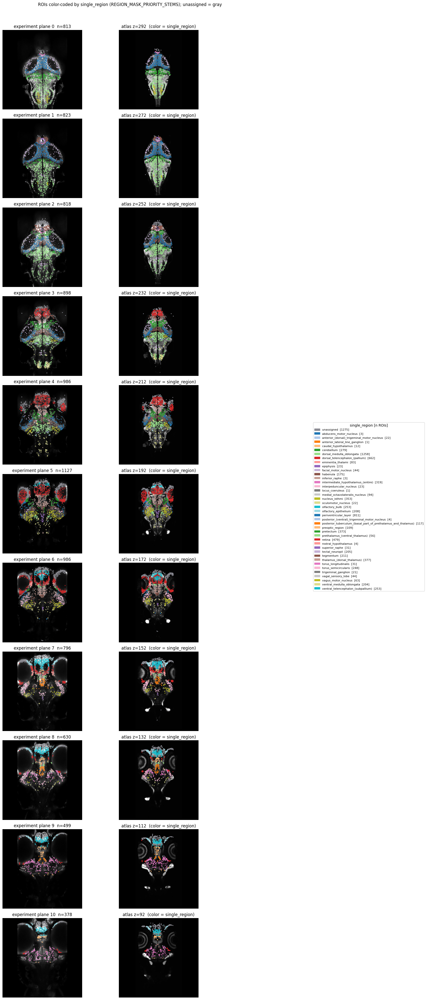

In [16]:
# Color-coded ROIs by `single_region`: experiment vs atlas for each EXPERIMENT_ATLAS_QC_PAIRS row.
import matplotlib.patches as mpatches

if "FISH_ROI_REGIONS" not in globals():
    raise RuntimeError("Run the region-assignment cell above first (defines FISH_ROI_REGIONS).")
if "target_img_by_plane" not in globals() or not target_img_by_plane:
    raise RuntimeError("Run the memmap cell (target_img_by_plane).")
if "atlas_slice_embedded" not in globals():
    raise RuntimeError("Run the EXPERIMENT_TO_MAPZEBRAIN_Z cell (defines atlas_slice_embedded).")
if "com_to_target_xy" not in globals():
    raise RuntimeError("com_to_target_xy missing — run an earlier setup cell.")

SINGLE_REGION_COLUMN = "single_region"
NA_LABEL = "unassigned"


def _unpack_com_v(c):
    v = np.asarray(c, dtype=float).ravel()
    if v.size < 2:
        raise ValueError(f"COM must have at least 2 values, got {c!r}")
    return float(v[0]), float(v[1])


def _single_region_label(val):
    if val is None or (isinstance(val, float) and np.isnan(val)):
        return NA_LABEL
    return str(val)


fr = FISH_ROI_REGIONS.copy()
fr["__lab"] = fr[SINGLE_REGION_COLUMN].map(_single_region_label)
_all_labels = sorted(set(fr["__lab"].tolist()), key=lambda s: (s != NA_LABEL, s))
if NA_LABEL not in _all_labels:
    _all_labels.append(NA_LABEL)
_na_rgb = (0.55, 0.55, 0.58)
_lab2rgb = {NA_LABEL: _na_rgb}
_i = 0
for _lb in _all_labels:
    if _lb == NA_LABEL:
        continue
    _lab2rgb[_lb] = plt.cm.tab20(_i % 20)[:3]
    _i += 1

_tvmin = float(globals().get("target_vmin", 0))
_tvmax = float(globals().get("target_vmax", 1000))
_svmax = float(globals().get("source_vmax", 1000))
_evmin = float(globals().get("QC_EXPERIMENT_VMIN", _tvmin))
_evmax = float(globals().get("QC_EXPERIMENT_VMAX", min(_tvmax, 380.0)))

_qc_rows_v = [(int(ep), int(mz)) for ep, mz in EXPERIMENT_ATLAS_QC_PAIRS if ep in target_img_by_plane]
if not _qc_rows_v:
    raise ValueError("No QC rows with memmap targets.")

_n = len(_qc_rows_v)
_fig, _axes = plt.subplots(_n, 2, figsize=(14, 3.6 * _n))
if _n == 1:
    _axes = np.asarray([_axes])

for _ri, (_pl, _mz) in enumerate(_qc_rows_v):
    _sub = fr[fr["plane"] == _pl]
    _tgt = target_img_by_plane[_pl]
    _src = atlas_slice_embedded(_mz)
    _ok = _sub["com_aligned_mapzebrain"].notna()
    _subo = _sub.loc[_ok]
    _labs = _subo["__lab"].tolist()
    _xy_e = np.array(
        [com_to_target_xy(*_unpack_com_v(c)) for c in _subo["com"]],
        dtype=float,
    )
    _xy_m = np.array(
        [tuple(_subo.loc[i, "com_aligned_mapzebrain"]) for i in _subo.index],
        dtype=float,
    )
    _cols = np.array([_lab2rgb.get(lb, _na_rgb) for lb in _labs])
    _axl, _axr = _axes[_ri, 0], _axes[_ri, 1]
    _axl.imshow(_tgt, cmap="gray", vmin=_evmin, vmax=_evmax)
    if len(_xy_e):
        _axl.scatter(_xy_e[:, 0], _xy_e[:, 1], c=_cols, s=6, alpha=0.92, linewidths=0)
    _axl.set_title(f"experiment plane {_pl}  n={len(_sub)}")
    _axl.axis("off")
    _axr.imshow(_src, cmap="gray", vmin=0, vmax=_svmax)
    if len(_xy_m):
        _axr.scatter(_xy_m[:, 0], _xy_m[:, 1], c=_cols, s=6, alpha=0.92, linewidths=0)
    _axr.set_title(f"atlas z={_mz}  (color = single_region)")
    _axr.axis("off")

_lab_counts = fr["__lab"].value_counts()
_handles = [
    mpatches.Patch(
        color=_lab2rgb[l],
        label=f"{l}  [{int(_lab_counts.get(l, 0))}]",
    )
    for l in _all_labels
    if l in _lab2rgb
]
_fig.legend(
    handles=_handles,
    loc="center left",
    bbox_to_anchor=(1.02, 0.5),
    fontsize=8,
    title="single_region [n ROIs]",
)
plt.suptitle(
    "ROIs color-coded by single_region (REGION_MASK_PRIORITY_STEMS); "
    + NA_LABEL
    + " = gray",
    y=1.01,
)
plt.tight_layout()
plt.subplots_adjust(right=0.82)
plt.show()

In [19]:
import pandas as pd
from pathlib import Path

# Locate the pack file
if "pack_path" not in globals():
    _cands = [exp_folder / "temporal_pack_compact_clean.h5",
              data_folder / "temporal_pack_compact_clean.h5"]
    pack_path = next((p for p in _cands if p.is_file()), None)
    if pack_path is None:
        raise FileNotFoundError("temporal_pack_compact_clean.h5 not found.")
pack_path = Path(pack_path).resolve()
print(f"pack: {pack_path}\n")

# Is the side table even there?
with pd.HDFStore(pack_path, "r") as st:
    keys = st.keys()
print("keys in file:", keys)
if "/com_aligned" not in keys:
    raise SystemExit("/com_aligned not written yet — run Cell #1.")

side = pd.read_hdf(pack_path, key="com_aligned")
print(f"\n/com_aligned: {len(side)} rows, columns: {list(side.columns)}")

# Per-fish region coverage
for col in ["region_aligned_mapzebrain", "single_region"]:
    if col not in side.columns:
        print(f"  [MISSING] {col} — regions NOT saved")
        continue
    if col == "single_region":
        n = side[col].notna().sum()
    else:  # list column: count non-empty
        n = side[col].map(lambda v: isinstance(v, (list, tuple)) and len(v) > 0).sum()
    print(f"  {col}: {n} / {len(side)} rows populated")

# Breakdown for the fish you just processed
fid = int(fish_name.split("_")[-2]) if "fish_name" in globals() else None
if fid is not None and "fish_id" in side.columns:
    sub = side[side["fish_id"] == fid]
    print(f"\nfish {fid}: {len(sub)} rows in side table")
    if "single_region" in sub.columns:
        print(sub["single_region"].value_counts(dropna=False).head(20))

pack: /Volumes/Kobi/DOI_animals_good/temporal_pack_compact_clean.h5

keys in file: ['/com_aligned', '/compact_temporal']

/com_aligned: 113893 rows, columns: ['pack_index', 'fish_id', 'plane', 'neuron', 'roi_index', 'com_aligned_mapzebrain', 'atlas_voxel_mapzebrain', 'region_aligned_mapzebrain', 'single_region']
  region_aligned_mapzebrain: 87793 / 113893 rows populated
  single_region: 87788 / 113893 rows populated

fish 15: 8754 rows in side table
single_region
None                                                             1275
dorsal_medulla_oblongata                                         1258
periventricular_layer                                             811
dorsal_telencephalon_(pallium)                                    662
retina                                                            479
thalamus_(dorsal_thalamus)                                        377
pretectum                                                         373
nucleus_isthmi                            

In [ ]:
# 3D interactive scatter of all ROI COMs for this fish, colored by region.
# Experiment-plane stacking: x/y/z all in embedded experiment pixels.
# z (px) = plane × (plane spacing µm / µm per px).
# Run AFTER the region-assignment cell (needs FISH_ROI_REGIONS).
import plotly.graph_objects as go
import plotly.express as px

if "FISH_ROI_REGIONS" not in globals():
    raise RuntimeError("Run the region-assignment cell above first (defines FISH_ROI_REGIONS).")
if "com_to_target_xy" not in globals():
    raise RuntimeError("com_to_target_xy missing — run an earlier setup cell.")

# From PrairieView sequence XML (e.g. sequence_0-155/sequence_0-155.xml → micronsPerPixel).
EXPERIMENT_UM_PER_PX = 0.783202792352194
EXPERIMENT_PLANE_SPACING_UM = 20  # micronsPerPixel ZAxis in functional sequence XML
PLANE_SPACING_PX = EXPERIMENT_PLANE_SPACING_UM / EXPERIMENT_UM_PER_PX

_fish_id_3d = int(exp_folder.name.split("_")[-2])
NA_LABEL = "unassigned"
NA_COLOR = "#a8a8a8"  # medium grey — reserved for unassigned only
NA_OPACITY = 0.2  # lower than assigned regions so unassigned recede visually
SINGLE_REGION_COLUMN = "single_region"


def _unpack_com(c):
    v = np.asarray(c, dtype=float).ravel()
    if v.size < 2:
        raise ValueError(f"COM must have at least 2 values, got {c!r}")
    return float(v[0]), float(v[1])


def _single_region_label(val):
    if val is None or (isinstance(val, float) and np.isnan(val)):
        return NA_LABEL
    return str(val)


def _is_greyish(color):
    h = str(color).lstrip("#")
    if len(h) == 3:
        h = "".join(ch * 2 for ch in h)
    r, g, b = (int(h[i : i + 2], 16) for i in (0, 2, 4))
    return max(r, g, b) - min(r, g, b) < 40


_raw_palette = (
    px.colors.qualitative.Plotly
    + px.colors.qualitative.D3
    + px.colors.qualitative.G10
    + px.colors.qualitative.T10
    + px.colors.qualitative.Alphabet
    + px.colors.qualitative.Dark24
)
_region_palette = []
for _c in _raw_palette:
    if _c in _region_palette or _is_greyish(_c):
        continue
    _region_palette.append(_c)


_f = FISH_ROI_REGIONS.copy()
_f = _f[_f["com"].notna()]

_xy = np.array([com_to_target_xy(*_unpack_com(c)) for c in _f["com"]], dtype=float)
xs, ys = _xy[:, 0], _xy[:, 1]
planes = _f["plane"].astype(float).to_numpy()
zs = planes * PLANE_SPACING_PX
_z_um = planes * EXPERIMENT_PLANE_SPACING_UM
regions = _f[SINGLE_REGION_COLUMN].map(_single_region_label).to_numpy()

_assigned = sorted(r for r in set(regions) if r != NA_LABEL)
_legend_labels = _assigned + ([NA_LABEL] if NA_LABEL in regions else [])

fig = go.Figure()
for i, reg in enumerate(_assigned):
    m = regions == reg
    fig.add_trace(go.Scatter3d(
        x=xs[m], y=ys[m], z=zs[m], mode="markers",
        name=f"{reg} ({int(m.sum())})",
        customdata=np.column_stack([planes[m], _z_um[m]]),
        marker=dict(size=2.5, color=_region_palette[i % len(_region_palette)], opacity=0.8),
        hovertemplate=(
            f"{reg}<br>"
            "plane=%{customdata[0]:.0f}<br>"
            "z=%{z:.1f} px (%{customdata[1]:.0f} µm)<br>"
            "x=%{x:.0f} y=%{y:.0f}<extra></extra>"
        ),
    ))

if NA_LABEL in set(regions):
    m = regions == NA_LABEL
    fig.add_trace(go.Scatter3d(
        x=xs[m], y=ys[m], z=zs[m], mode="markers",
        name=f"{NA_LABEL} ({int(m.sum())})",
        customdata=np.column_stack([planes[m], _z_um[m]]),
        marker=dict(size=2.5, color=NA_COLOR, opacity=NA_OPACITY),
        hovertemplate=(
            f"{NA_LABEL}<br>"
            "plane=%{customdata[0]:.0f}<br>"
            "z=%{z:.1f} px (%{customdata[1]:.0f} µm)<br>"
            "x=%{x:.0f} y=%{y:.0f}<extra></extra>"
        ),
    ))

_legend_rows = max(1, int(np.ceil(len(_legend_labels) / 6)))
_bottom_margin = 24 + 20 * _legend_rows
fig.update_layout(
    title=f"fish {_fish_id_3d}: {len(_f)} ROI COMs (experiment planes, color = single_region)",
    scene=dict(
        xaxis_title="x (px)",
        yaxis_title="y (px)",
        zaxis_title="z (px)",
        aspectmode="data",
    ),
    legend=dict(
        orientation="h",
        itemsizing="constant",
        font=dict(size=8),
        yanchor="top",
        y=-0.02,
        x=0.5,
        xanchor="center",
    ),
    margin=dict(t=50, b=_bottom_margin),
    width=950,
    height=720,
)
fig.show()
fig.write_html(str(exp_folder / f"coms_3d_exp_planes_fish{_fish_id_3d}.html"))
print(
    f"z scale: {PLANE_SPACING_PX:.2f} px/plane "
    f"({EXPERIMENT_PLANE_SPACING_UM} µm / {EXPERIMENT_UM_PER_PX:.4f} µm/px)"
)
print(f"{len(_legend_labels)} labels: {', '.join(_legend_labels[:8])}{'…' if len(_legend_labels) > 8 else ''}")


z scale: 25.54 px/plane (20 µm / 0.7832 µm/px)
40 labels: abducens_motor_nucleus, anterior_(dorsal)_trigeminal_motor_nucleus, anterior_lateral_line_ganglion, caudal_hypothalamus, cerebellum, dorsal_medulla_oblongata, dorsal_telencephalon_(pallium), eminentia_thalami…


In [15]:
# --- COMs floating inside the mapzebrain reference volume (napari, 3D) ---
# ATLAS FRAME: uses com_aligned_mapzebrain (NOT raw com) so points register to the volume.
# Needs FISH_ROI_REGIONS with com_aligned_mapzebrain + single_region (run persist + region cells first).
# napari opens its own window. In Jupyter: run `%gui qt` once, then delete the napari.run() line.
import numpy as np, pandas as pd, tifffile, napari
import plotly.express as px
import matplotlib.colors as mcolors

W_EMBED = 1024
NA_LABEL, NA_COLOR = "unassigned", "#a8a8a8"
SINGLE_REGION_COLUMN, COM_ALIGNED_COL = "single_region", "com_aligned_mapzebrain"

if "FISH_ROI_REGIONS" not in globals():
    raise RuntimeError("Run the region-assignment cell first (defines FISH_ROI_REGIONS).")
_plane_to_z = dict(EXPERIMENT_ATLAS_QC_PAIRS) if "EXPERIMENT_ATLAS_QC_PAIRS" in globals() \
    else dict(EXPERIMENT_TO_MAPZEBRAIN_Z)

_f = FISH_ROI_REGIONS.copy()
_f = _f[_f[COM_ALIGNED_COL].notna() & _f["plane"].isin(_plane_to_z)]
if _f.empty:
    raise RuntimeError(f"No rows with {COM_ALIGNED_COL} for paired planes — run the COM-persist/align cell first.")

def _xy(c):
    v = np.asarray(c, dtype=float).ravel(); return float(v[0]), float(v[1])
_pairs = np.array([_xy(c) for c in _f[COM_ALIGNED_COL]], dtype=float)
x, y = _pairs[:, 0], _pairs[:, 1]                          # atlas col / row (px)
z = _f["plane"].map(_plane_to_z).astype(float).to_numpy()  # atlas slice
def _label(v):
    return NA_LABEL if (v is None or (isinstance(v, float) and np.isnan(v))) else str(v)
regions = _f[SINGLE_REGION_COLUMN].map(_label).to_numpy()
pts = np.column_stack([z, y, x])                           # napari order (z, y, x)

# same palette as your plotly cell: skip greys, grey reserved for unassigned
def _greyish(c):
    h = str(c).lstrip("#");  h = "".join(ch*2 for ch in h) if len(h) == 3 else h
    r, g, b = (int(h[i:i+2], 16) for i in (0, 2, 4));  return max(r, g, b) - min(r, g, b) < 40
_raw = (px.colors.qualitative.Plotly + px.colors.qualitative.D3 + px.colors.qualitative.G10
        + px.colors.qualitative.T10 + px.colors.qualitative.Alphabet + px.colors.qualitative.Dark24)
_palette = [c for i, c in enumerate(_raw) if c not in _raw[:i] and not _greyish(c)]
_assigned = sorted(r for r in set(regions) if r != NA_LABEL)
_color_of = {reg: _palette[i % len(_palette)] for i, reg in enumerate(_assigned)}

# reference volume in the SAME embedded frame, only over the z-range the data covers
_atlas_path = Path(globals().get("mapzebrain_img_path",
                                 "./reference_images/hindbrain/mapzebrain/T_AVG_HuCD.tif"))
_stack = tifffile.imread(str(_atlas_path))                 # (Z, H, W)
z0, z1 = int(z.min()), int(z.max())
_vol = np.stack([sitkalignment.embed_image(_stack[zz], W_EMBED)
                 for zz in range(z0, z1 + 1)]).astype(_stack.dtype, copy=False)

viewer = napari.Viewer(ndisplay=3)
viewer.add_image(_vol, name="mapzebrain (HuC/D)", colormap="gray",
                 rendering="attenuated_mip", opacity=0.5, blending="additive",
                 translate=(z0, 0, 0),
                 contrast_limits=[float(_vol.min()), float(np.percentile(_vol, 99.5))])

_amask = regions != NA_LABEL
if _amask.any():
    _rgba = np.array([mcolors.to_rgba(_color_of[r], alpha=0.9) for r in regions[_amask]])
    viewer.add_points(pts[_amask], name="ROI COMs (by region)", size=4,
                      blending="translucent", properties={"region": regions[_amask]},
                      face_color=_rgba)
if (~_amask).any():
    viewer.add_points(pts[~_amask], name=f"{NA_LABEL} ({int((~_amask).sum())})",
                      size=3, blending="translucent", face_color=NA_COLOR, opacity=0.2)

napari.run()   # delete this line if you ran `%gui qt` in Jupyter

In [16]:
# --- 4D: watch COM fluorescence over time inside the mapzebrain volume (napari) ---
# Static positions (atlas frame); a frame slider recolors points by raw_norm_temporal[:, t].
import numpy as np, tifffile, napari
import matplotlib as mpl
from magicgui.widgets import Slider

W_EMBED = 1024
COM_ALIGNED_COL, TRACE_COL = "com_aligned_mapzebrain", "raw_norm_temporal"
CMAP = mpl.colormaps["magma"]      # bright = high fluorescence
BASE_SIZE = 4

if "FISH_ROI_REGIONS" not in globals():
    raise RuntimeError("Run the region-assignment cell first (defines FISH_ROI_REGIONS).")
_plane_to_z = dict(EXPERIMENT_ATLAS_QC_PAIRS) if "EXPERIMENT_ATLAS_QC_PAIRS" in globals() \
    else dict(EXPERIMENT_TO_MAPZEBRAIN_Z)

# rows with an aligned COM, a paired plane, AND a trace
_f = FISH_ROI_REGIONS.copy()
_f = _f[_f[COM_ALIGNED_COL].notna() & _f["plane"].isin(_plane_to_z) & _f[TRACE_COL].notna()]
if _f.empty:
    raise RuntimeError(f"No rows with {COM_ALIGNED_COL} + {TRACE_COL} for paired planes.")

def _xy(c):
    v = np.asarray(c, float).ravel(); return float(v[0]), float(v[1])
_pairs = np.array([_xy(c) for c in _f[COM_ALIGNED_COL]], float)
z = _f["plane"].map(_plane_to_z).astype(float).to_numpy()
pts = np.column_stack([z, _pairs[:, 1], _pairs[:, 0]])      # napari order (z, y, x)

# trace matrix (N, T) — SAME row order as pts
_lengths = {len(np.asarray(t).ravel()) for t in _f[TRACE_COL]}
if len(_lengths) != 1:
    raise ValueError(f"Traces differ in length: {sorted(_lengths)[:5]} — expected all equal.")
traces = np.vstack([np.asarray(t, np.float32).ravel() for t in _f[TRACE_COL]])
N, T = traces.shape

# global robust color scaling (see note for per-ROI alternative)
vmin, vmax = np.nanpercentile(traces, [2, 99])
def _colors(frame):
    v = np.nan_to_num(np.clip((traces[:, frame] - vmin) / (vmax - vmin + 1e-9), 0, 1))
    return CMAP(v)                                          # (N, 4)

# reference volume in the same embedded frame
_atlas_path = Path(globals().get("mapzebrain_img_path",
                   "./reference_images/hindbrain/mapzebrain/T_AVG_HuCD.tif"))
_stack = tifffile.imread(str(_atlas_path))
_z0, _z1 = int(z.min()), int(z.max())
_vol = np.stack([sitkalignment.embed_image(_stack[zz], W_EMBED)
                 for zz in range(_z0, _z1 + 1)]).astype(_stack.dtype, copy=False)

viewer = napari.Viewer(ndisplay=3)
viewer.add_image(_vol, name="mapzebrain (HuC/D)", colormap="gray",
                 rendering="attenuated_mip", opacity=0.4, blending="additive",
                 translate=(_z0, 0, 0),
                 contrast_limits=[float(_vol.min()), float(np.percentile(_vol, 99.5))])
_act = viewer.add_points(pts, name="COM activity", size=BASE_SIZE,
                         blending="translucent", face_color=_colors(0))

_slider = Slider(label="frame", min=0, max=T - 1, value=0)
def _on_frame(frame):
    _act.face_color = _colors(int(frame)); _act.refresh()
_slider.changed.connect(_on_frame)
viewer.window.add_dock_widget(_slider, area="bottom", name="time")

# optional autoplay (~20 fps loop):
# from qtpy.QtCore import QTimer
# _timer = QTimer(); _timer.timeout.connect(lambda: setattr(_slider, "value", (_slider.value + 1) % T)); _timer.start(50)

napari.run()   # delete if you used %gui qt

In [24]:
# --- animate COM brightness, region colors preserved ---
import numpy as np, napari
import plotly.express as px
import matplotlib.colors as mcolors
from magicgui.widgets import Slider

for _v in ("_f", "pts", "traces", "vmin", "vmax", "_vol", "_z0", "T"):
    if _v not in globals():
        raise RuntimeError("Run the activity cell first (defines _f, pts, traces, vmin, vmax, _vol, _z0, T).")

SIZE        = 4.0     # smaller points
LUM_FLOOR   = 0.12    # brightness at rest (0.0 = goes black when inactive)
ALPHA_FLOOR = 0.10    # opacity at rest (0.0 = invisible until active)
ALPHA_GAIN  = 0.90
NA_LABEL, NA_COLOR = "unassigned", "#a8a8a8"
SINGLE_REGION_COLUMN = "single_region"

def _label(x):
    return NA_LABEL if (x is None or (isinstance(x, float) and np.isnan(x))) else str(x)
def _greyish(c):
    h = str(c).lstrip("#"); h = "".join(ch*2 for ch in h) if len(h) == 3 else h
    r, g, b = (int(h[i:i+2], 16) for i in (0, 2, 4)); return max(r, g, b) - min(r, g, b) < 40
_raw = (px.colors.qualitative.Plotly + px.colors.qualitative.D3 + px.colors.qualitative.G10
        + px.colors.qualitative.T10 + px.colors.qualitative.Alphabet + px.colors.qualitative.Dark24)
_palette = [c for i, c in enumerate(_raw) if c not in _raw[:i] and not _greyish(c)]
_regions = _f[SINGLE_REGION_COLUMN].map(_label).to_numpy()           # same order as pts/traces
_keep = _regions != NA_LABEL
_regions = _regions[_keep]
_pts_plot, _traces_plot = pts[_keep], traces[_keep]
_assigned = sorted(r for r in set(_regions) if r != NA_LABEL)
_color_of = {r: _palette[i % len(_palette)] for i, r in enumerate(_assigned)}
_color_of[NA_LABEL] = NA_COLOR
_base_rgb = np.array([mcolors.to_rgb(_color_of[r]) for r in _regions])  # (N, 3) hue per point

def _norm(frame):
    return np.nan_to_num(np.clip((_traces_plot[:, frame] - vmin) / (vmax - vmin + 1e-9), 0, 1))
def _rgba(v):
    rgb = _base_rgb * (LUM_FLOOR + (1 - LUM_FLOOR) * v[:, None])      # value scales, hue preserved
    a = (ALPHA_FLOOR + ALPHA_GAIN * v)[:, None]
    return np.hstack([rgb, a]).astype(float)

viewer = napari.Viewer(ndisplay=3)
viewer.add_image(_vol, name="mapzebrain (HuC/D)", colormap="gray",
                 rendering="attenuated_mip", opacity=0.35, blending="additive",
                 translate=(_z0, 0, 0),
                 contrast_limits=[float(_vol.min()), float(np.percentile(_vol, 99.5))])
_pts = viewer.add_points(_pts_plot, name="COM activity (region hue, brightness=activity)",
                         size=SIZE, blending="translucent",
                         properties={"region": _regions}, face_color=_rgba(_norm(0)))

for _attr in ("border_width", "edge_width"):   # napari renamed edge_->border_ in 0.5
    if hasattr(_pts, _attr):
        setattr(_pts, _attr, 0)
        break

_slider = Slider(label="frame", min=0, max=T - 1, value=0)
def _on_frame(frame):
    _pts.face_color = _rgba(_norm(int(frame))); _pts.refresh()
_slider.changed.connect(_on_frame)
viewer.window.add_dock_widget(_slider, area="bottom", name="time")

# optional autoplay (~20 fps):
# from qtpy.QtCore import QTimer
# _timer = QTimer(); _timer.timeout.connect(lambda: setattr(_slider, "value", (_slider.value + 1) % T)); _timer.start(50)

napari.run()   # delete if you used %gui qt